In [2]:

from __future__ import division, print_function, unicode_literals
import sys
assert sys.version_info >= (3, 5)

import sklearn
assert sklearn.__version__ >= "0.20"

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import os 


np.random.seed(42) 


%matplotlib inline
import matplotlib as mpl
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)



In [3]:
# read data
df =  pd.read_excel('melting_kmeans.xlsx')
df.dropna(inplace=True) #删除包含缺失值的行
X=df.replace(0,0.00001)
df.head()

,P_setting (gpa),T_setting (℃),SIO2(WT%)_CPX,TIO2(WT%)_CPX,AL2O3(WT%)_CPX,CR2O3(WT%)_CPX,FEOT(WT%)_CPX,MNO(WT%)_CPX,MGO(WT%)_CPX,CAO(WT%)_CPX,...,SIO2(WT%)_OL,TIO2(WT%)_OL,AL2O3(WT%)_OL,CR2O3(WT%)_OL,FEOT(WT%)_OL,MNO(WT%)_OL,MGO(WT%)_OL,CAO(WT%)_OL,NA2O(WT%)_OL,Label
0,2.290347,1103.943481,53.160000,0.320000,7.670000,0.980000,3.150000,14.380000,0.0900,17.900000,...,40.700000,0.012290,0.023976,0.028041,9.890000,49.14000,0.170000,0.080000,0.011904,P
1,2.373686,992.395203,52.361303,0.693555,5.923964,0.568507,2.318700,15.233026,0.0856,21.250595,...,40.421001,0.022147,0.005480,0.028041,8.923127,49.66144,0.118364,0.036694,0.011904,P
2,2.843462,1023.366028,54.007937,0.084300,4.148461,0.858360,2.216147,16.423937,0.0745,21.254380,...,40.928960,0.007180,0.015540,0.028041,8.760100,49.60402,0.116700,0.097020,0.011904,P
3,2.070606,1056.811768,53.010000,0.430000,5.920000,0.790000,2.860000,15.780000,0.0900,21.280000,...,41.060000,0.012290,0.023976,0.020000,9.960000,49.28000,0.160000,0.051500,0.011904,P
4,2.405847,986.574890,52.982000,0.535000,4.605000,1.203000,1.976000,15.626000,0.0000,21.282000,...,41.421000,0.000000,0.029000,0.000000,8.167000,50.03900,0.000000,0.031000,0.012000,P


In [4]:
# check the missing value
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11911 entries, 0 to 11910
Data columns (total 30 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   P_setting (gpa)  11911 non-null  float64
 1   T_setting (℃)    11911 non-null  float64
 2   SIO2(WT%)_CPX    11911 non-null  float64
 3   TIO2(WT%)_CPX    11911 non-null  float64
 4   AL2O3(WT%)_CPX   11911 non-null  float64
 5   CR2O3(WT%)_CPX   11911 non-null  float64
 6   FEOT(WT%)_CPX    11911 non-null  float64
 7   MNO(WT%)_CPX     11911 non-null  float64
 8   MGO(WT%)_CPX     11911 non-null  float64
 9   CAO(WT%)_CPX     11911 non-null  float64
 10  NA2O(WT%)_CPX    11911 non-null  float64
 11  SIO2(WT%)_OPX    11911 non-null  float64
 12  TIO2(WT%)_OPX    11911 non-null  float64
 13  AL2O3(WT%)_OPX   11911 non-null  float64
 14  CR2O3(WT%)_OPX   11911 non-null  float64
 15  FEOT(WT%)_OPX    11911 non-null  float64
 16  MNO(WT%)_OPX     11911 non-null  float64
 17  MGO(WT%)_OPX

In [5]:
# Separate true labels from features
data = X.drop('Label',axis=1)
labels = X['Label'].copy()
np.unique(labels)

array(['P', 'T'], dtype=object)

In [6]:
#labels

In [7]:
# Obtain the number of samples and the number of features
n_samples, n_features = data.shape
# Obtain the number of labels
n_labels = len(np.unique(labels))

In [8]:
np.unique(labels)

array(['P', 'T'], dtype=object)

In [9]:
labels.value_counts()

P    11472
T      439
Name: Label, dtype: int64

# KMeans Algorithm Clustering

In [13]:
from sklearn import metrics

def get_marks(estimator, df, name=None, kmeans=None, af=None):
 """
    Get the score. There are five types of information that need to know the true classification information of the dataset, and three types that don't need. Refer to readme.txt for details
    For Kmeans, use Silhouette Score generally 
    
    :param estimator: Model
    :param name: Initialisation method
    :param data: Feature dataset
    """
    estimator.fit(X)
    print(20 * '*', name, 20 * '*')
    if kmeans:
        print("Mean Inertia Score: ", estimator.inertia_)
    elif af:
        cluster_centers_indices = estimator.cluster_centers_indices_
        print("The estimated number of clusters: ", len(cluster_centers_indices))
    print("Homogeneity Score: ", metrics.homogeneity_score(labels, estimator.labels_))
    print("Completeness Score: ", metrics.completeness_score(labels, estimator.labels_))
    print("V Measure Score: ", metrics.v_measure_score(labels, estimator.labels_))
    print("Adjusted Rand Score: ", metrics.adjusted_rand_score(labels, estimator.labels_))
    print("Adjusted Mutual Info Score: ", metrics.adjusted_mutual_info_score(labels, estimator.labels_))
    print("Calinski Harabasz Score: ", metrics.calinski_harabasz_score(data, estimator.labels_))
    print("Silhouette Score: ", metrics.silhouette_score(data, estimator.labels_))

IndentationError: unexpected indent (1890388855.py, line 12)

In [14]:
from sklearn.cluster import KMeans

# Use K-Means for clustering, set cluster=2, and set different initialization methods ('k-means++' and'random')
km1 = KMeans(init='k-means++', n_clusters=5, n_init=10, random_state=42)
km2 = KMeans(init='random', n_clusters=5, n_init=10, random_state=42)
print("n_labels: %d \t n_samples: %d \t n_features: %d" % (n_labels, n_samples, n_features))
get_marks(km1, data, name="k-means++", kmeans=True)
get_marks(km2, data, name="random", kmeans=True)

n_labels: 2 	 n_samples: 11911 	 n_features: 29


NameError: name 'get_marks' is not defined

In [23]:
# The label of each sample after clustering
km1.labels_

AttributeError: 'KMeans' object has no attribute 'labels_'

In [24]:
# Unique labels
np.unique(km2.labels_)

AttributeError: 'KMeans' object has no attribute 'labels_'

In [25]:
# Write the clustering results into the original table
df['km_clustering_label'] = km1.labels_
# Export the table as csv format
df.to_csv('result.csv')

AttributeError: 'KMeans' object has no attribute 'labels_'

In [26]:
# Different from data, df is the original data set
df.head()

,SIO2(WT%),TIO2(WT%),AL2O3(WT%),CR2O3(WT%),FEOT(WT%),CAO(WT%),MGO(WT%),MNO(WT%),NA2O(WT%),SIO2(WT%)_OPX,TIO2(WT%)_OPX,AL2O3(WT%)_OPX,CR2O3(WT%)_OPX,FEOT(WT%)_OPX,CAO(WT%)_OPX,MGO(WT%)_OPX,MNO(WT%)_OPX,NA2O(WT%)_OPX,Label
0,53.160000,0.320000,7.670000,0.980000,3.150000,17.900000,14.380000,0.0900,2.690000,54.070000,0.080000,4.830000,0.350000,6.320000,0.760000,33.100000,0.140000,0.1200,P
1,52.361303,0.693555,5.923964,0.568507,2.318700,21.250595,15.233026,0.0856,1.631090,55.578613,0.124257,3.577360,0.228081,5.941102,0.424352,34.010324,0.155557,0.0410,P
2,54.007937,0.084300,4.148461,0.858360,2.216147,21.254380,16.423937,0.0745,1.088955,55.685927,0.074700,3.133397,0.393871,5.761907,0.373629,34.160387,0.131938,0.0494,P
3,53.010000,0.430000,5.920000,0.790000,2.860000,21.280000,15.780000,0.0900,1.130000,54.930000,0.130000,4.460000,0.310000,6.530000,0.630000,33.100000,0.150000,0.0400,P
4,52.982000,0.535000,4.605000,1.203000,1.976000,21.282000,15.626000,0.0000,1.250000,57.711000,0.070000,2.552000,0.318000,5.283000,0.455000,34.450000,0.000000,0.0630,P


In [27]:
from sklearn.model_selection import GridSearchCV

# Use GridSearchCV to automatically find the best parameters, kmeans is used here as a classification model, not clustering
params = {'init':('k-means++', 'random'), 'n_clusters':[2, 3, 4, 5, 6], 'n_init':[5, 10, 15]}
cluster = KMeans(random_state=42)
# Use adjusted rand score (adjusted_rand_score) as the score. Refer to readme.txt for details
km_best_model = GridSearchCV(cluster, params, cv=3, scoring='adjusted_rand_score',
                             verbose=1, n_jobs=-1)
# Since external evaluation indicators are selected, the true classification information of the original dataset is needed.
km_best_model.fit(data, labels)

Fitting 3 folds for each of 30 candidates, totalling 90 fits


GridSearchCV(cv=3, estimator=KMeans(random_state=42), n_jobs=-1,
             param_grid={'init': ('k-means++', 'random'),
                         'n_clusters': [2, 3, 4, 5, 6], 'n_init': [5, 10, 15]},
             scoring='adjusted_rand_score', verbose=1)

In [28]:
# Parameters of the best model
km_best_model.best_params_

{'init': 'k-means++', 'n_clusters': 4, 'n_init': 5}

In [29]:
# Scores of the best model
km_best_model.best_score_

0.021069013398021863

In [30]:
# Obtain the best model
km3 = km_best_model.best_estimator_
km3

KMeans(n_clusters=4, n_init=5, random_state=42)

In [31]:
# Obtain 8 scores of the best model，Refer to readme.txt for details
get_marks(km3, data, name="k-means++", kmeans=True)

NameError: name 'get_marks' is not defined

In [ ]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from matplotlib import pyplot as plt

def plot_scores(init, max_k, data, labels):
    '''
    Draw three scoring diagrams for different initialization methods of kmeans
    
    :param init: Initialization methods ('k-means++' and 'random')
    :param max_k: Maximum number of cluster centers
    :param data: Feature dataset
    :param labels: True labels dataset
    '''
    
    i = []
    inertia_scores = []
    y_silhouette_scores = []
    y_calinski_harabaz_scores = []
    
    for k in range(2, max_k):
        kmeans_model = KMeans(n_clusters=k, random_state=1, init=init, n_init=10)
        pred = kmeans_model.fit_predict(data)
        i.append(k)
        inertia_scores.append(kmeans_model.inertia_)
        y_silhouette_scores.append(silhouette_score(data, pred))
        y_calinski_harabaz_scores.append(calinski_harabasz_score(data, pred))
    
    new = [inertia_scores, y_silhouette_scores, y_calinski_harabaz_scores]
    for j in range(len(new)):
        plt.figure(j+1)
        plt.plot(i, new[j], 'bo-')
        plt.xlabel('n_clusters')
        if j == 0:
            name = 'inertia'
        elif j == 1:
            name = 'silhouette'
        else:
            name = 'calinski_harabasz'
        plt.ylabel('{}_scores'.format(name))
        plt.title('{}_scores with {} init'.format(name, init))

In [ ]:
plot_scores('k-means++', 18, data, labels)

In [ ]:
plot_scores('random', 10, data, labels)

In [ ]:
from sklearn.metrics import silhouette_samples, silhouette_score
from matplotlib.ticker import FixedLocator, FixedFormatter

def plot_silhouette_diagram(clusterer, X, show_xlabels=True,
                            show_ylabels=True, show_title=True):
    """
    Plot silhouette diagram
    
    :param clusterer: Trained clustering model (here the number of clusters can be set in advance, you can slightly modify the code to replace it with one that cannot be set in advance)
    :param X: Feature-only dataset
    :param show_xlabels: If true, add abscissa information
    :param show_ylabels: If true, add ordinate information
    :param show_title: If true, add the figure name
    """
    
    y_pred = clusterer.labels_
    silhouette_coefficients = silhouette_samples(X, y_pred)
    silhouette_average = silhouette_score(X, y_pred)
    
    padding = len(X) // 30
    pos = padding
    ticks = []
    for i in range(clusterer.n_clusters):
        coeffs = silhouette_coefficients[y_pred == i]
        coeffs.sort()
        
        color = mpl.cm.Spectral(i / clusterer.n_clusters)
        plt.fill_betweenx(np.arange(pos, pos + len(coeffs)), 0, coeffs,
                          facecolor=color, edgecolor=color, alpha=0.7)
        ticks.append(pos + len(coeffs) // 2)
        pos += len(coeffs) + padding
    
    plt.axvline(x=silhouette_average, color="red", linestyle="--")
    
    plt.gca().yaxis.set_major_locator(FixedLocator(ticks))
    plt.gca().yaxis.set_major_formatter(FixedFormatter(range(clusterer.n_clusters)))
    
    if show_xlabels:
        plt.gca().set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
        plt.xlabel("Silhouette Coefficient")
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel("Cluster")
    if show_title:
        plt.title("init:{}  n_cluster:{}".format(clusterer.init, clusterer.n_clusters))

In [ ]:
plt.figure(figsize=(15, 4))
plt.subplot(121)
plot_silhouette_diagram(km1, data)
plt.subplot(122)
plot_silhouette_diagram(km3, data, show_ylabels=False)
save_fig("silhouette_diagram")

# MiniBatch KMeans

In [ ]:
from sklearn.cluster import MiniBatchKMeans

In [ ]:
# Test the running speed of KMeans algorithm
%timeit KMeans(n_clusters=3).fit(data)

In [ ]:
# Test the running speed of MiniBatchKMeans algorithm
%timeit MiniBatchKMeans(n_clusters=5).fit(data)

In [15]:
from timeit import timeit

times = np.empty((100, 2))
inertias = np.empty((100, 2))
for k in range(1, 101):
    kmeans = KMeans(n_clusters=k, random_state=42)
    minibatch_kmeans = MiniBatchKMeans(n_clusters=k, random_state=42)
    print("\r Training: {}/{}".format(k, 100), end="")
    times[k-1, 0] = timeit("kmeans.fit(data)", number=10, globals=globals())
    times[k-1, 1] = timeit("minibatch_kmeans.fit(data)", number=10, globals=globals())
    inertias[k-1, 0] = kmeans.inertia_
    inertias[k-1, 1] = minibatch_kmeans.inertia_

NameError: name 'MiniBatchKMeans' is not defined

NameError: name 'save_fig' is not defined

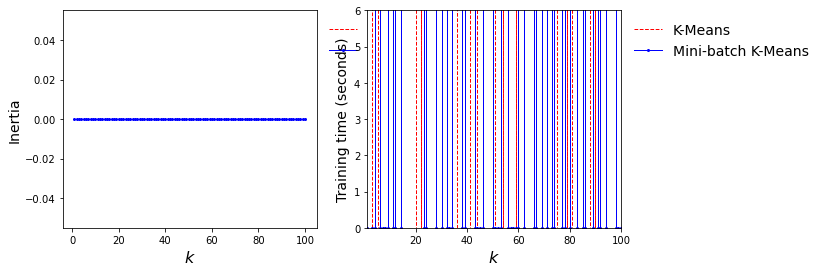

In [16]:
plt.figure(figsize=(10, 4))

plt.subplot(121)
plt.plot(range(1, 101), inertias[:, 0], "r--", label="K-Means")
plt.plot(range(1, 101), inertias[:, 1], "b.-", label="Mini-batch K-Means")
plt.xlabel("$k$", fontsize=16)
plt.ylabel("Inertia", fontsize=14)
plt.legend(fontsize=14)

plt.subplot(122)
plt.plot(range(1, 101), times[:, 0], "r--", label="K-Means")
plt.plot(range(1, 101), times[:, 1], "b.-", label="Mini-batch K-Means")
plt.xlabel("$k$", fontsize=16)
plt.ylabel("Training time (seconds)", fontsize=14)
plt.axis([1, 100, 0, 6])
plt.legend(fontsize=14)

save_fig("minibatch_kmeans_vs_kmeans")
plt.show()

# Clustering after dimensionality reduction

In [17]:
pip install --user pyrolite

^C
Note: you may need to restart the kernel to use updated packages.


In [18]:
pip install pyrolite

^C
Note: you may need to restart the kernel to use updated packages.


In [19]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pyrolite.comp
# data need to be stanRdardized before dimension reduction for dimensionless method#
#scaler = StandardScaler()
#data = pd.DataFrame(scaler.fit_transform(data))
# Use general PCA for dimension reduction, reducing features from 11 dimensions to 3 dimensions
scaler = StandardScaler()
X_processed = pd.DataFrame(scaler.fit_transform(data.pyrocomp.CLR()))# data need to be standardized before dimension reduction for dimensionless method


Defaulting to user installation because normal site-packages is not writeable


In [20]:
#df2 =  pd.read_excel('C:\\Users\\lenovo\\Desktop\\Trainingset\\kmeans\\X_processed.xlsx')
pca1 = PCA(n_components=2) #n_labels
#df2.dropna(inplace=True) #删除包含缺失值的行
#X1=df2.replace(0,0.00001)
X_reduced1 = pca1.fit_transform(X_processed)

km4 = KMeans(init=pca1.components_, n_clusters=2, n_init=10)
#get_marks(km4, data, name="PCA-based KMeans", kmeans=True)

In [21]:
X_reduced1.shape

(11911, 2)

In [22]:
# The feature dimension of the training dataset is reduced to 2 dimensions
len(pca1.components_)

2

In [23]:
# Use general PCA to reduce dimension, reduce features to 2 dimensions, and visualize 2D planes
pca2 = PCA(n_components=2)
reduced_data = pca2.fit_transform(X_reduced1)
# Use k-means for clustering, set cluster=3, and initialize the method as'k-means++'
kmeans1 = KMeans(init="k-means++", n_clusters=2, n_init=10)
kmeans2 = KMeans(init="random", n_clusters=2, n_init=10)
kmeans1.fit(reduced_data)
kmeans2.fit(reduced_data)

KMeans(init='random', n_clusters=2)

In [24]:
# The feature dimension of the training dataset is reduced to 2 dimensions
len(pca2.components_)

2

In [25]:
# The 2-dimensional eigenvalues (after dimensionality reduction)
X_reduced1

array([[-2.32038158, -0.83545538],
       [-1.80873689, -0.68671566],
       [-1.44516096, -0.76021016],
       ...,
       [-5.6034585 ,  8.81982963],
       [-5.58017029,  8.48790965],
       [-5.74380675,  8.45494401]])

In [26]:
pd.DataFrame(reduced_data).to_excel('REDUCEDMAJORPP.xlsx')

In [27]:
# The coordinates of the 3 cluster centers
kmeans1.cluster_centers_

array([[ 4.87388997,  0.76532551],
       [-1.34228986, -0.21077387]])

In [28]:
from matplotlib.colors import ListedColormap

def plot_data(X, real_tag=True):
    """
    Draw a scatter plot
    
    :param X: Dataset containing eigenvalues only
    :param real_tag: If there is a value, color the scattered points with different categories
    """
#    try:
#        if not real_tag:
#            plt.plot(X[:, 0], X[:, 1], 'k.', markersize=1, alpha=0.2)
#    except ValueError:
#        types = list(np.unique(real_tag))
#        for i in range(len(types)):
    plt.plot(X[:, 0][real_tag=='P'], X[:, 1][real_tag=='P'],'.'
                 ,label="{}".format('P'), markersize=8,color='grey',alpha=0.3)
    plt.plot(X[:, 0][real_tag=='T'], X[:, 1][real_tag=='T'],'.',
                     marker='D', label="{}".format('T'), markersize=6,color='orangered',alpha=0.6)  # label='M'.format(types[i]),
  #  plt.plot(X[:, 0][real_tag=='N'], X[:, 1][real_tag=='N'],'.', label="{}".format('N'), markersize=6,alpha=0.5)

 #   plt.legend(loc='lower right',fontsize=20)

def plot_centroids(centroids, circle_color='w', cross_color='k'):
    """
    Draw cluster center
    
    :param centroids: Cluster center coordinates
    :param circle_color: The color of the circle
    :param cross_color: The color of the cross
    """
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='o', s=30, zorder=10, linewidths=8,
                color=circle_color,alpha=0)
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='x', s=50, zorder=11, linewidths=50,
                color=cross_color, alpha=0)

def plot_centroids_labels(clusterer):
    labels = np.unique(clusterer.labels_)
    centroids = clusterer.cluster_centers_
    for i in range(centroids.shape[0]):
        t = str(labels[i])
        plt.text(centroids[i, 0]-1, centroids[i, 1]-1, t, fontsize=25,
                 zorder=10, bbox=dict(boxstyle='round', fc='yellow', alpha=0.5))
    
def plot_decision_boundaried(clusterer, X, tag=None, resolution=1000, 
                             show_centroids=True, show_xlabels=True,
                             show_ylabels=True, show_title=True,
                             show_centroids_labels=False):
    """
    Draw the decision boundary and fill in color
    
    :param clusterer: Trained clustering model (you can set the number of cluster centers in advance or not in advance)
    :param X: Dataset containing eigenvalues only
    :param tag: The dataset containing only real classification information. Color the scattered points that have the values.
    :param resolution: Similar image resolution, color the smallest unit
    :param show_centroids: If true, draw the cluster center
    :param show_centroids_labels: If true, label the center of the cluster
    """
    mins = X.min(axis=0) - 0.1
    maxs = X.max(axis=0) + 0.1
    xx, yy = np.meshgrid(np.linspace(-20,20 , resolution),#mins[0]maxs[0]
                         np.linspace(-10, maxs[1], resolution))#mins[1]
    Z = clusterer.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    
    # Customize the color by using color code or color
    # custom_cmap = ListedColormap(["#fafab0", "#9898ff", "#a0faa0"])
    plt.contourf(xx, yy, Z, extent=(mins[0], maxs[0],mins[1] , maxs[1]),cmap="Paired",alpha=0.2)
    plt.contour(xx, yy, Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),colors='k')#
    
    try:
        if not tag:
            plot_data(X)
    except ValueError:
        plot_data(X, real_tag=tag)
    if show_centroids:
        plot_centroids(clusterer.cluster_centers_)
    if show_centroids_labels:
        plot_centroids_labels(clusterer)
    if show_xlabels:
        plt.xlabel(r"$x_1$", fontsize=14)
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel(r"$x_2$", fontsize=14, rotation=0)
    else:
        plt.tick_params(labelleft=False)
#    if show_title:
  #      plt.title("init:{}  n_cluster:{}".format(clusterer.init, clusterer.n_clusters))

In [32]:
fig=plt.figure(figsize=(20, 20),dpi=900)
#plt.subplot(121)
#plot_decision_boundaried(kmeans1, reduced_data, tag=labels)
#plt.subplot(122)
plt.rcParams['font.sans-serif'] = 'Arial'
plot_decision_boundaried(kmeans2,X_reduced1, tag=labels,show_centroids_labels=False)
plt.tick_params(axis='both',width=2,length=10, labelsize=45)
# plt.xticks(np.linspace(-10,10,5,endpoint=True))
# plt.yticks(np.linspace(-10,35,10,endpoint=True))
plt.rcParams["contour.linewidth"]=2
plt.ylabel('PCA2', fontsize=50, rotation=90)
plt.xlabel('PCA1', fontsize=50, rotation=0)
plt.xlim((-10, 20))
#plt.ylim((-5, 20))
ax=plt.gca();
ax.spines['bottom'].set_linewidth(2);###
ax.spines['left'].set_linewidth(2);###
ax.spines['right'].set_linewidth(2);###
ax.spines['top'].set_linewidth(2);####

plt.show()
#fig.savefig('Figure6.eps',dpi=600,format='eps')

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_40160\3162611983.py:18: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "." (-> marker='.'). The keyword argument will take precedence.
  plt.plot(X[:, 0][real_tag=='T'], X[:, 1][real_tag=='T'],'.',


In [42]:
kmeans3 = KMeans(init="k-means++", n_clusters=3, n_init=3)
kmeans4 = KMeans(init="k-means++", n_clusters=4, n_init=3)
kmeans5 = KMeans(init="k-means++", n_clusters=5, n_init=3)
kmeans6 = KMeans(init="k-means++", n_clusters=6, n_init=3)

kmeans3.fit(reduced_data)
kmeans4.fit(reduced_data)
kmeans5.fit(reduced_data)
kmeans6.fit(reduced_data)

KMeans(n_clusters=6, n_init=3)

<ipython-input-39-08cd4fa45599>:18: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "." (-> marker='.'). The keyword argument will take precedence.
  plt.plot(X[:, 0][real_tag=='L'], X[:, 1][real_tag=='L'],'.',


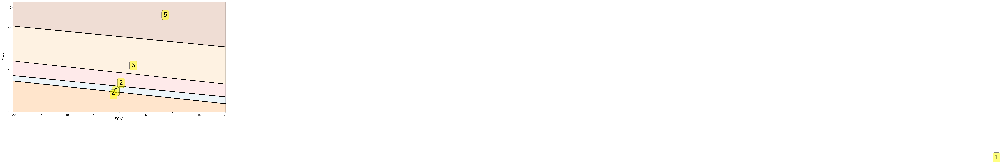

In [43]:
plt.figure(figsize=(15, 8),dpi=300)#
plot_decision_boundaried(kmeans6, reduced_data, show_centroids=False,show_centroids_labels=True)
plt.ylabel(r"$PCA2$", fontsize=14, rotation=90)
plt.xlabel(r"$PCA1$", fontsize=14, rotation=0)
plt.show()

<ipython-input-133-d8e291826518>:18: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "." (-> marker='.'). The keyword argument will take precedence.
  plt.plot(X[:, 0][real_tag=='L'], X[:, 1][real_tag=='L'],'.',
<ipython-input-133-d8e291826518>:18: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "." (-> marker='.'). The keyword argument will take precedence.
  plt.plot(X[:, 0][real_tag=='L'], X[:, 1][real_tag=='L'],'.',
<ipython-input-133-d8e291826518>:18: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "." (-> marker='.'). The keyword argument will take precedence.
  plt.plot(X[:, 0][real_tag=='L'], X[:, 1][real_tag=='L'],'.',
<ipython-input-133-d8e291826518>:18: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "." (-> marker='.'). The keyword argument will take precedence.
  plt.plot(X[:, 0][real_tag

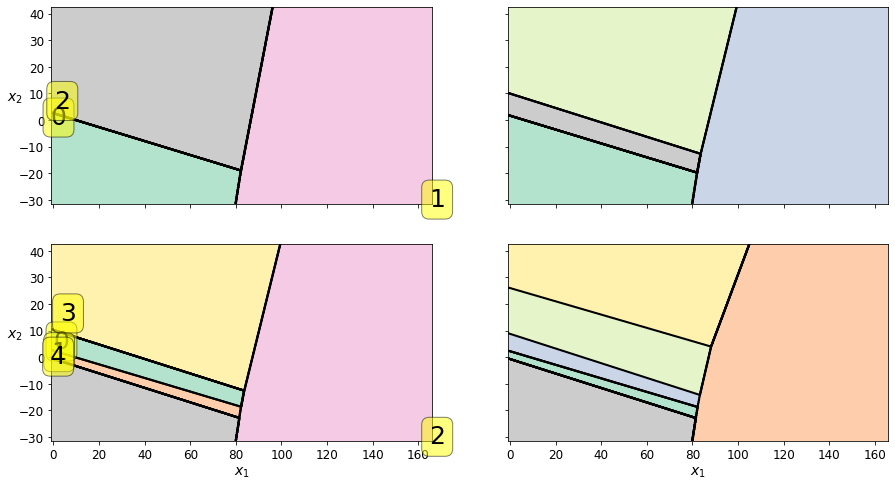

In [138]:
plt.figure(figsize=(15, 8))
plt.subplot(221)
plot_decision_boundaried(kmeans3, reduced_data, show_xlabels=False, show_centroids_labels=True)
plt.subplot(222)
plot_decision_boundaried(kmeans4, reduced_data, show_ylabels=False, show_xlabels=False)
plt.subplot(223)
plot_decision_boundaried(kmeans5, reduced_data, show_centroids_labels=True)
plt.subplot(224)
plot_decision_boundaried(kmeans6, reduced_data, show_ylabels=False)
#save_fig("reduced_and_cluster")
plt.show()